<a href="https://colab.research.google.com/github/CFVV/MSc-assignments/blob/main/2022-2_Computer_Audition/Project_Tempo_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Proyecto Final - Audición por computador
# Detección de tempo
## Camila Vera Villa


In [ ]:
! pip install libfmp

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 110 kB 8.2 MB/s 
     |████████████████████████████████| 18.5 MB 3.4 MB/s 
     |████████████████████████████████| 793 kB 60.2 MB/s 
     |████████████████████████████████| 5.6 MB 13.7 MB/s 
     |████████████████████████████████| 381 kB 53.1 MB/s 
     |████████████████████████████████| 51 kB 6.1 MB/s 
  Created wheel for music21: filename=music21-5.7.2-py3-none-any.whl size=22024624 sha256=9a8e039e2a72cf8ed0253f531365ea1d617ec5c68e16edecbc8bde5c27202bcf
  Stored in directory: /root/.cache/pip/wheels/bc/cb/ae/fd264ebf1e9cf01c15576ee4c128f1bfd907a120c0a7a5b542
  Created wheel for pretty-midi: filename=pretty_midi-0.2.9-py3-none-any.whl size=5591955 sha256=dcbac31be9ffa3509e0030c065a0d19197c60491b50eecb3132da5f11a770ace
  Stored in directory: /root/.cache/pip/wheels/ad/74/7c/a06473ca8dcb63efb98c1e67667ce39d52100f837835ea18fa
Successfully built music2

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import numpy, scipy, matplotlib.pyplot as plt, IPython.display as ipd
import librosa, librosa.display
import seaborn as sn
import numpy as np
import pandas as pd
from sklearn.metrics import mean_absolute_error
import os, sys
import matplotlib.gridspec as gridspec
from matplotlib import pyplot as plt
from scipy import signal
import libfmp.b
from libfmp.c6 import compute_local_average
from scipy.interpolate import interp1d
from numba import jit
import libfmp.b
import libfmp.c2
import libfmp.c3
import libfmp.c6
from glob import glob
import warnings
warnings.filterwarnings('ignore')

In [ ]:
path = "/content/drive/MyDrive/Magíster en Ciencias de la Ingeniería UC/2022-2_Audición_computador/Proyecto_tempo_detection/"

In [ ]:
x, sr = librosa.load(path +'audios/extracto1_Aria O. Rieding op.3 variación1 allegro moderato_negra82.mp3')
print(x.shape, sr)

(1268647,) 22050


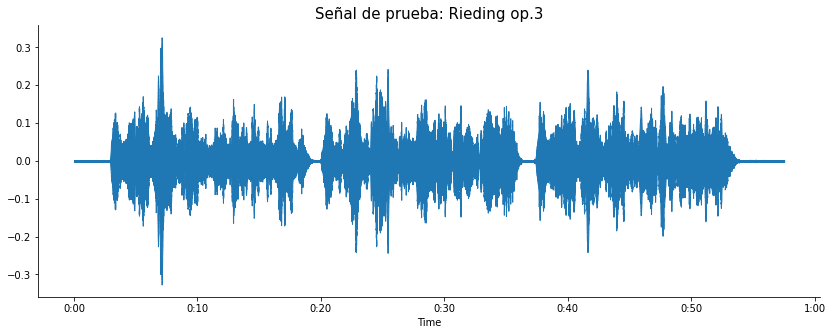

In [ ]:
plt.figure(figsize=(14, 5))
librosa.display.waveshow(x, sr = sr)
plt.title('Señal de prueba: Rieding op.3', fontsize = 15)
sn.despine();

In [ ]:
ipd.Audio(x, rate=sr)

# Experimentación con funciones de novelty

## Basadas en energía

### RMSE

In [ ]:
hop_length = 1024
frame_length = 1024
rmse = librosa.feature.rms(y = x, frame_length=frame_length, hop_length=hop_length).flatten()
rmse_diff = numpy.zeros_like(rmse)
rmse_diff[1:] = numpy.diff(rmse)

In [ ]:
print(f'longitud del vector de RMSE de la señal: {rmse.shape}')
print(f'longitud del vector de la primera derivada del RMSE de la señal: {rmse_diff.shape}')

longitud del vector de RMSE de la señal: (1239,)
longitud del vector de la primera derivada del RMSE de la señal: (1239,)


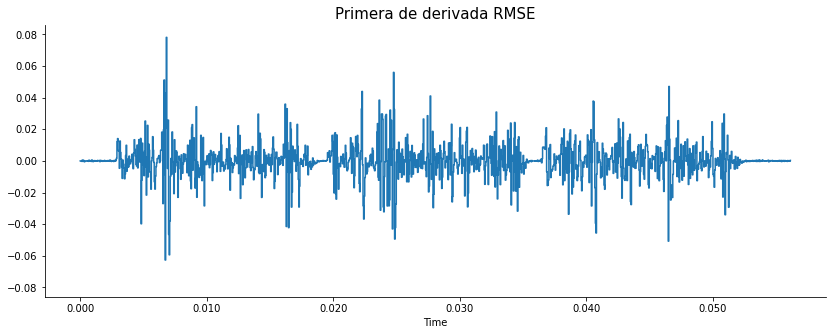

In [ ]:
plt.figure(figsize=(14, 5))
librosa.display.waveshow(rmse_diff, sr = sr)
plt.title('Primera de derivada RMSE', fontsize = 15)
sn.despine();

Ahora se debe aplicar una rectificación de media onda (Half-wave rectification) sobre el vector de la primera derivada

In [ ]:
energy_novelty = numpy.max([numpy.zeros_like(rmse_diff), rmse_diff], axis=0)

In [ ]:
frames = numpy.arange(len(rmse))
t = librosa.frames_to_time(frames, sr=sr)

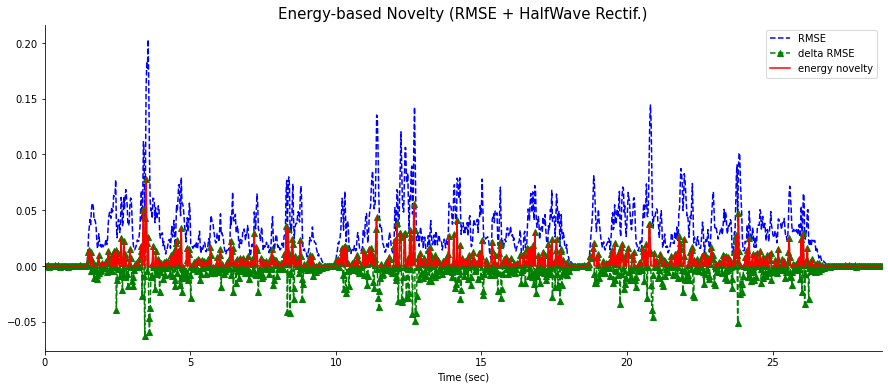

In [ ]:
plt.figure(figsize=(15, 6))

plt.plot(t, rmse, 'b--', t, rmse_diff, 'g--^', t, energy_novelty, 'r-')
plt.xlim(0, t.max())
plt.xlabel('Time (sec)')
plt.legend(('RMSE', 'delta RMSE', 'energy novelty'))
plt.title('Energy-based Novelty (RMSE + HalfWave Rectif.)', fontsize = 15)
sn.despine()

### Log-Energy

La idea de esta función de novelty es dar cuenta por la escala de percepción logarítimica con la que los humanos percibimos el sonido. la transformación se aplica antes de calcular la derivada de rmse

In [ ]:
log_rmse = numpy.log1p(10*rmse)
log_rmse_diff = numpy.zeros_like(log_rmse)
log_rmse_diff[1:] = numpy.diff(log_rmse)

In [ ]:
log_energy_novelty = numpy.max([numpy.zeros_like(log_rmse_diff), log_rmse_diff], axis=0)

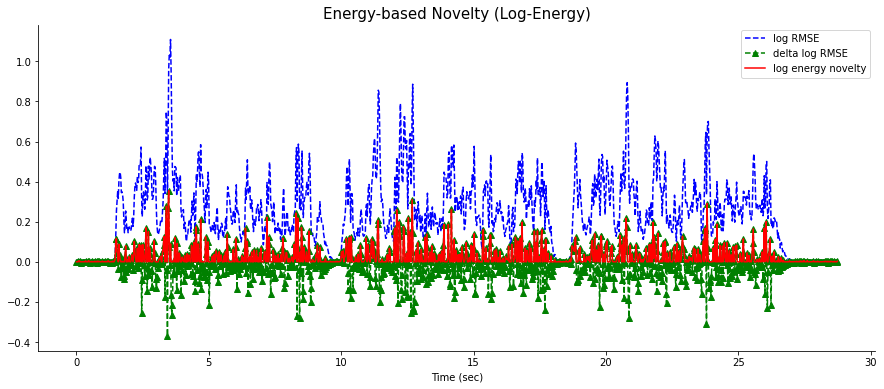

In [ ]:
plt.figure(figsize=(15, 6))
plt.plot(t, log_rmse, 'b--', t, log_rmse_diff, 'g--^', t, log_energy_novelty, 'r-')
plt.xlabel('Time (sec)')
plt.legend(('log RMSE', 'delta log RMSE', 'log energy novelty'))
plt.title('Energy-based Novelty (Log-Energy)', fontsize = 15)
sn.despine()

Ambas funciones de novelty al parecer obtienen resultados muy similares

### Basadas en el espectro

La implementación de la función `onset_strength` de `librosa` usa una función de novelty basada en el flujo espectral:

In [ ]:
spectral_novelty = librosa.onset.onset_strength(y = x, sr = sr, max_size = 1024)

In [ ]:
spectral_novelty.shape

(2478,)

In [ ]:
frames = numpy.arange(len(spectral_novelty))
t = librosa.frames_to_time(frames, sr=sr)

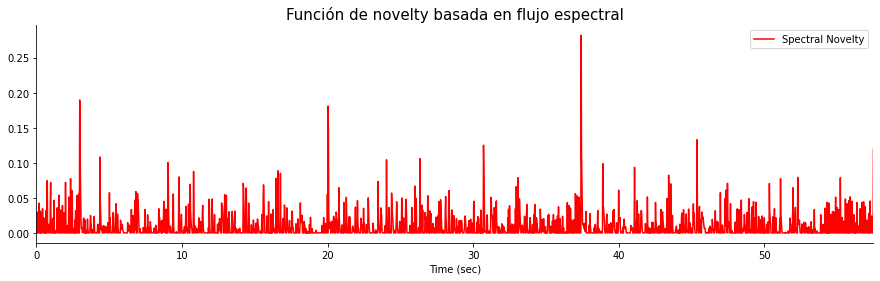

In [ ]:
plt.figure(figsize=(15, 4))
plt.plot(t, spectral_novelty, 'r-')
plt.xlim(0, t.max())
plt.xlabel('Time (sec)')
plt.legend(('Spectral Novelty',))
plt.title('Función de novelty basada en flujo espectral', fontsize = 15)
sn.despine()


## Comparación de las 3 funciones de novelty

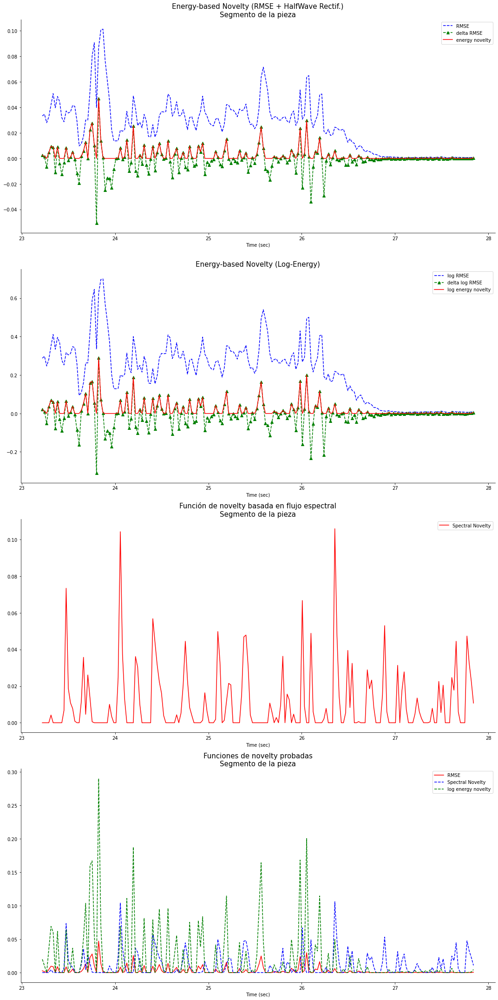

In [ ]:

fig, ax = plt.subplots(4,1, figsize=(15, 30))

ax[0].plot(t[1000:1200], rmse[1000:1200], 'b--', t[1000:1200], rmse_diff[1000:1200], 'g--^', t[1000:1200], energy_novelty[1000:1200], 'r-')
ax[0].set_xlabel('Time (sec)')
ax[0].legend(('RMSE', 'delta RMSE', 'energy novelty'))
ax[0].set_title('Energy-based Novelty (RMSE + HalfWave Rectif.)\nSegmento de la pieza', fontsize = 15)
sn.despine()

ax[1].plot(t[1000:1200], log_rmse[1000:1200], 'b--', t[1000:1200], log_rmse_diff[1000:1200], 'g--^', t[1000:1200], log_energy_novelty[1000:1200], 'r-')
ax[1].set_xlabel('Time (sec)')
ax[1].legend(('log RMSE', 'delta log RMSE', 'log energy novelty'))
ax[1].set_title('Energy-based Novelty (Log-Energy)', fontsize = 15)
sn.despine()

ax[2].plot(t[1000:1200], spectral_novelty[1000:1200], 'r-')
ax[2].set_xlabel('Time (sec)')
ax[2].legend(('Spectral Novelty',))
ax[2].set_title('Función de novelty basada en flujo espectral\nSegmento de la pieza', fontsize = 15)
sn.despine()


ax[3].plot(t[1000:1200], energy_novelty[1000:1200], 'r-', t[1000:1200], spectral_novelty[1000:1200], 'b--', t[1000:1200], log_energy_novelty[1000:1200], 'g--')
ax[3].set_xlabel('Time (sec)')
ax[3].legend(('RMSE', 'Spectral Novelty', 'log energy novelty'))
ax[3].set_title('Funciones de novelty probadas\nSegmento de la pieza', fontsize = 15)
sn.despine()

plt.tight_layout()

## Fase

In [ ]:
def compute_novelty_phase(x, Fs=1, N=1024, H=64, M=40, norm=True):
    """Compute phase-based novelty function

    Notebook: C6/C6S1_NoveltyPhase.ipynb

    Args:
        x (np.ndarray): Signal
        Fs (scalar): Sampling rate (Default value = 1)
        N (int): Window size (Default value = 1024)
        H (int): Hop size (Default value = 64)
        M (int): Determines size (2M+1) in samples of centric window  used for local average (Default value = 40)
        norm (bool): Apply max norm (if norm==True) (Default value = True)

    Returns:
        novelty_phase (np.ndarray): Energy-based novelty function
        Fs_feature (scalar): Feature rate
    """
    X = librosa.stft(x, n_fft=N, hop_length=H, win_length=N, window='hanning')
    Fs_feature = Fs / H
    phase = np.angle(X) / (2*np.pi)
    phase_diff = principal_argument(np.diff(phase, axis=1))
    phase_diff2 = principal_argument(np.diff(phase_diff, axis=1))
    novelty_phase = np.sum(np.abs(phase_diff2), axis=0)
    novelty_phase = np.concatenate((novelty_phase, np.array([0, 0])))
    if M > 0:
        local_average = compute_local_average(novelty_phase, M)
        novelty_phase = novelty_phase - local_average
        novelty_phase[novelty_phase < 0] = 0
    if norm:
        max_value = np.max(novelty_phase)
        if max_value > 0:
            novelty_phase = novelty_phase / max_value
    return novelty_phase, Fs_feature
def principal_argument(v):
    """Principal argument function

    | Notebook: C6/C6S1_NoveltyPhase.ipynb, see also
    | Notebook: C8/C8S2_InstantFreqEstimation.ipynb

    Args:
        v (float or np.ndarray): Value (or vector of values)

    Returns:
        w (float or np.ndarray): Principle value of v
    """
    w = np.mod(v + 0.5, 1) - 0.5
    return w

In [ ]:
nov, Fs_nov = compute_novelty_phase(x, Fs=sr, M=10, norm=1, H = 2, N = 1024)

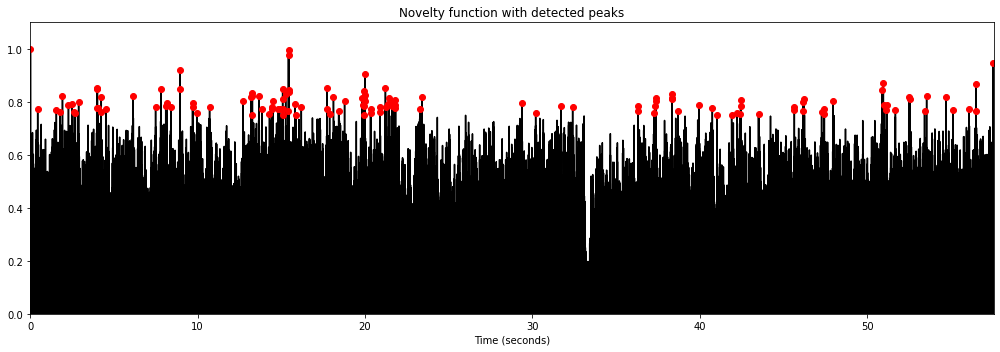

<Figure size 432x288 with 0 Axes>

In [ ]:
peaks, properties = signal.find_peaks(nov, prominence=0.75)
T_coef = np.arange(nov.shape[0]) / Fs_nov
peaks_sec = T_coef[peaks]
fig, ax, line = libfmp.b.plot_signal(nov, Fs_nov, color='k',
                    title='Novelty function with detected peaks', figsize = (14,5))

plt.plot(peaks_sec, nov[peaks], 'ro')
plt.show()
sn.despine()

x_peaks = librosa.clicks(times = peaks_sec, sr=sr, click_freq=1000, length=len(x))
ipd.display(ipd.Audio(x + x_peaks, rate=sr))

# Energy based novelty

In [ ]:
def compute_novelty_energy(x, Fs=1, N=2048, H=128, gamma=10.0, norm=True):
    """Compute energy-based novelty function

    Notebook: C6/C6S1_NoveltyEnergy.ipynb

    Args:
        x (np.ndarray): Signal
        Fs (scalar): Sampling rate (Default value = 1)
        N (int): Window size (Default value = 2048)
        H (int): Hop size (Default value = 128)
        gamma (float): Parameter for logarithmic compression (Default value = 10.0)
        norm (bool): Apply max norm (if norm==True) (Default value = True)

    Returns:
        novelty_energy (np.ndarray): Energy-based novelty function
        Fs_feature (scalar): Feature rate
    """
    # x_power = x**2
    w = signal.hann(N)
    Fs_feature = Fs / H
    energy_local = np.convolve(x**2, w**2, 'same')
    energy_local = energy_local[::H]
    if gamma is not None:
        energy_local = np.log(1 + gamma * energy_local)
    energy_local_diff = np.diff(energy_local)
    energy_local_diff = np.concatenate((energy_local_diff, np.array([0])))
    novelty_energy = np.copy(energy_local_diff)
    novelty_energy[energy_local_diff < 0] = 0
    if norm:
        max_value = max(novelty_energy)
        if max_value > 0:
            novelty_energy = novelty_energy / max_value
    return novelty_energy, Fs_feature

In [ ]:
nov, Fs_nov = compute_novelty_energy(x, Fs=sr, H = 1200)#libfmp.c6.compute_novelty_spectrum(x, Fs=sr, H = 1200)

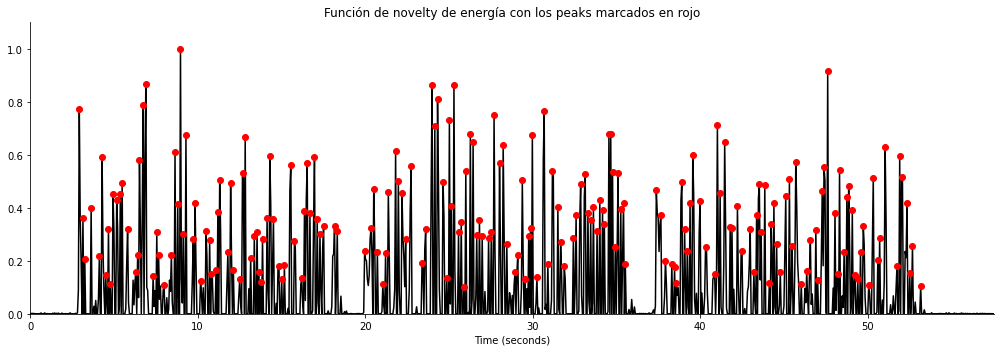

In [ ]:
peaks, properties = signal.find_peaks(nov, prominence=0.1)
T_coef = np.arange(nov.shape[0]) / Fs_nov
peaks_sec = T_coef[peaks]
fig, ax, line = libfmp.b.plot_signal(nov, Fs_nov, color='k',
                    title='Función de novelty de energía con los peaks marcados en rojo', figsize = (14,5))
sn.despine()
plt.plot(peaks_sec, nov[peaks], 'ro')
plt.show()


x_peaks = librosa.clicks(times = peaks_sec, sr=sr, click_freq=1000, length=len(x))
ipd.display(ipd.Audio(x + x_peaks, rate=sr))

# Spectral based novelty

In [ ]:
nov, Fs_nov = libfmp.c6.compute_novelty_spectrum(x, Fs=sr, H = 1200)

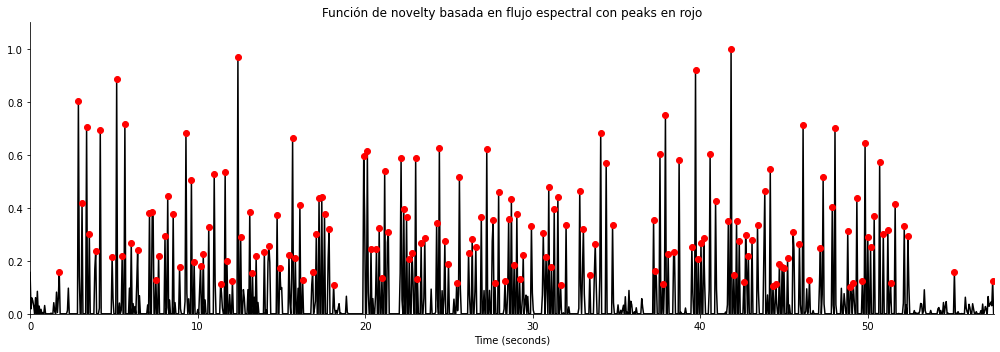

In [ ]:
peaks, properties = signal.find_peaks(nov, prominence=0.1)
T_coef = np.arange(nov.shape[0]) / Fs_nov
peaks_sec = T_coef[peaks]
fig, ax, line = libfmp.b.plot_signal(nov, Fs_nov, color='k',
                    title='Función de novelty basada en flujo espectral con peaks en rojo', figsize = (14,5))
sn.despine()
plt.plot(peaks_sec, nov[peaks], 'ro')
plt.show()


x_peaks = librosa.clicks(times = peaks_sec, sr=sr, click_freq=1000, length=len(x))
ipd.display(ipd.Audio(x + x_peaks, rate=sr))

Novelty basado en flujo espectral tiende a confundirse en los vibratos

# Cálculo de tempograma de fourier

In [ ]:
@jit(nopython=True)
def compute_tempogram_fourier(x, Fs, N, H, Theta=np.arange(30, 301, 1)):
    """Compute Fourier-based tempogram [FMP, Section 6.2.2]

    Notebook: C6/C6S2_TempogramFourier.ipynb

    Args:
        x (np.ndarray): Input signal
        Fs (scalar): Sampling rate
        N (int): Window length
        H (int): Hop size
        Theta (np.ndarray): Set of tempi (given in BPM) (Default value = np.arange(30, 301, 1))

    Returns:
        X (np.ndarray): Tempogram
        T_coef (np.ndarray): Time axis (seconds)
        F_coef_BPM (np.ndarray): Tempo axis (BPM)
    """
    win = np.hanning(N)
    N_left = N // 2
    L = x.shape[0]
    L_left = N_left
    L_right = N_left
    L_pad = L + L_left + L_right
    # x_pad = np.pad(x, (L_left, L_right), 'constant')  # doesn't work with jit
    x_pad = np.concatenate((np.zeros(L_left), x, np.zeros(L_right)))
    t_pad = np.arange(L_pad)
    M = int(np.floor(L_pad - N) / H) + 1
    K = len(Theta)
    X = np.zeros((K, M), dtype=np.complex_)

    for k in range(K):
        omega = (Theta[k] / 60) / Fs
        exponential = np.exp(-2 * np.pi * 1j * omega * t_pad)
        x_exp = x_pad * exponential
        for n in range(M):
            t_0 = n * H
            t_1 = t_0 + N
            X[k, n] = np.sum(win * x_exp[t_0:t_1])
        T_coef = np.arange(M) * H / Fs
        F_coef_BPM = Theta
    return X, T_coef, F_coef_BPM

# Usando un novelty de flujo espectral

In [ ]:
nov, Fs_nov = libfmp.c6.compute_novelty_spectrum(x, Fs=sr, N=2048, H=512, gamma=100, M=10, norm=True)
nov, Fs_nov = libfmp.c6.resample_signal(nov, Fs_in=Fs_nov, Fs_out=100)

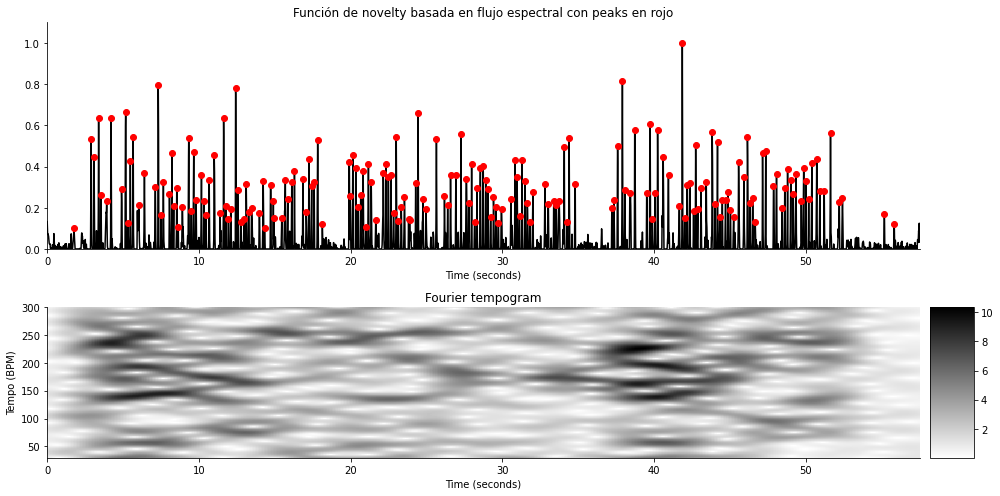

In [ ]:
N = 800 #corresponding to 5 seconds (Fs_nov = 100)
H = 10
Theta = np.arange(30, 301,1)
X, T_coef, F_coef_BPM = compute_tempogram_fourier(nov, Fs_nov, N=N, H=H, Theta=Theta)
tempogram = np.abs(X)

fig, ax = plt.subplots(2, 2, gridspec_kw={'width_ratios': [1, 0.05],
                                          'height_ratios': [1.5, 1]}, figsize=(14,7))
libfmp.b.plot_signal(nov, Fs_nov, ax=ax[0,0], color='k',
                     title='Función de novelty basada en flujo espectral con peaks en rojo',)

peaks, properties = signal.find_peaks(nov, prominence=0.1)
T_coef = np.arange(nov.shape[0]) / Fs_nov
peaks_sec = T_coef[peaks]

sn.despine()
ax[0,0].plot(peaks_sec, nov[peaks], 'ro')


ax[0,1].set_axis_off()
libfmp.b.plot_matrix(tempogram, T_coef=T_coef, F_coef=F_coef_BPM, ax=[ax[1,0], ax[1,1]],
                     title='Fourier tempogram', ylabel='Tempo (BPM)', colorbar=True);
plt.tight_layout()

En este caso se puede ver que cercano a los 125 BPM hay un tempo que aparece en las zonas donde no hay pausas de manera bastante marcada, al igual que en los 150 BPM y 300BPM aprox.

Veamos qué BPMs son los que tienen mayor valor medio a lo largo de la pieza

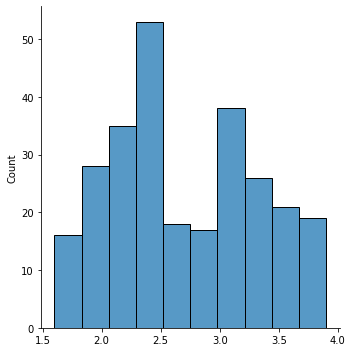

In [ ]:
sn.displot(tempogram.mean(axis = 1).round(1))

 Este método siempre tiende a encontrar el tatum, auditivamente se observó que esto correspondía a una corchea por lo que se divide en 2 para obtener una aproximación al tempo que marcaría la medida de tempo italiana.

In [ ]:
np.median(F_coef_BPM[tempogram.mean(axis = 1).round(1) > 1.4])/2

82.5

In [ ]:
ipd.Audio(x, rate=sr)

# Función de tempo automático

In [ ]:
def calculate_bpm(audio_path, graphs = True):
    x, sr = librosa.load(audio_path)

    nov, Fs_nov = libfmp.c6.compute_novelty_spectrum(x, Fs=sr, N=2048, H=512, gamma=100, M=10, norm=True)
    nov, Fs_nov = libfmp.c6.resample_signal(nov, Fs_in=Fs_nov, Fs_out=100)
    N = 800 #corresponding to 5 seconds (Fs_nov = 100)
    H = 10
    Theta = np.arange(30, 301,1)
    X, T_coef, F_coef_BPM = compute_tempogram_fourier(nov, Fs_nov, N=N, H=H, Theta=Theta)
    tempogram = np.abs(X)
    if graphs:
        fig, ax = plt.subplots(2, 2, gridspec_kw={'width_ratios': [1, 0.05],
                                              'height_ratios': [1.5, 1]}, figsize=(14,7))
        libfmp.b.plot_signal(nov, Fs_nov, ax=ax[0,0], color='k',
                             title='Función de novelty basada en flujo espectral con peaks en rojo',)

        peaks, properties = signal.find_peaks(nov, prominence=0.1)
        T_coef = np.arange(nov.shape[0]) / Fs_nov
        peaks_sec = T_coef[peaks]

        sn.despine()
        ax[0,0].plot(peaks_sec, nov[peaks], 'ro')


        ax[0,1].set_axis_off()
        libfmp.b.plot_matrix(tempogram, T_coef=T_coef, F_coef=F_coef_BPM, ax=[ax[1,0], ax[1,1]],
                             title='Fourier tempogram', ylabel='Tempo (BPM)', colorbar=True);
        plt.tight_layout()
        sn.displot(tempogram.mean(axis = 1).round(1))
        plt.title('Distirbución del valor medio \nde los BPM a través de la pieza', fontsize = 15)

    return {'percentil_70': np.mean(F_coef_BPM[tempogram.mean(axis = 1).round(1) >= np.quantile(tempogram.mean(axis = 1)\
                                                                                    .round(1), 0.7)]),
           'top_10':np.mean(F_coef_BPM[np.argpartition(tempogram.mean(axis = 1).round(-1), -10)[-10:]])}

{'percentil_70': 198.94623655913978, 'top_10': 138.9}

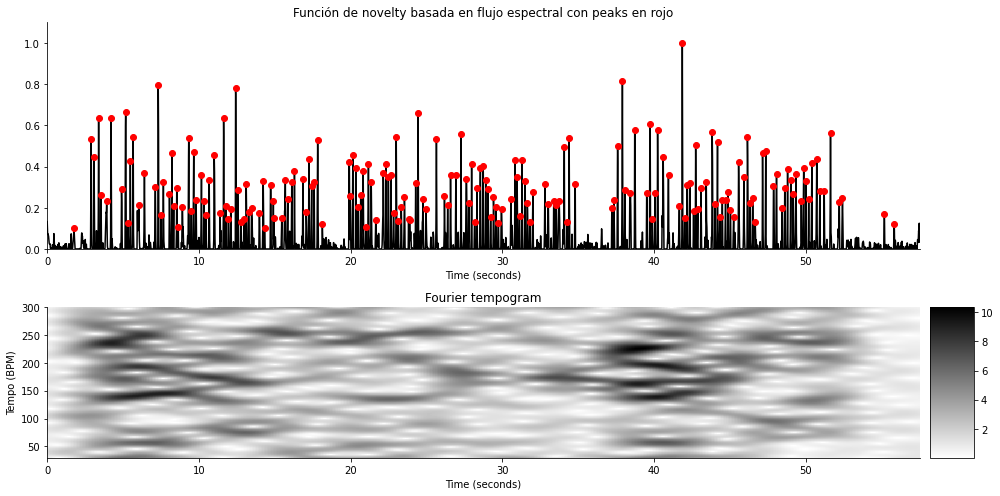

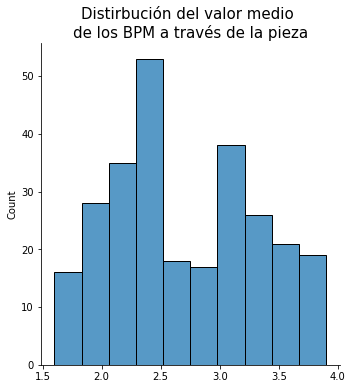

In [ ]:
calculate_bpm(path + 'audios/extracto1_Aria O. Rieding op.3 variación1 allegro moderato_negra82.mp3')

Ahora para todos los audios

In [ ]:
glob(path + 'audios/*.mp3')

['/content/drive/MyDrive/Magíster en Ciencias de la Ingeniería UC/2022-2_Audición_computador/Proyecto_tempo_detection/audios/extracto7_Indifference_blaca con punto 63.mp3',
 '/content/drive/MyDrive/Magíster en Ciencias de la Ingeniería UC/2022-2_Audición_computador/Proyecto_tempo_detection/audios/extracto8_DanzaHungaraNolck_negra130.mp3',
 '/content/drive/MyDrive/Magíster en Ciencias de la Ingeniería UC/2022-2_Audición_computador/Proyecto_tempo_detection/audios/extracto9_Prestopartita3bach_negra110.mp3',
 '/content/drive/MyDrive/Magíster en Ciencias de la Ingeniería UC/2022-2_Audición_computador/Proyecto_tempo_detection/audios/extracto6_Czardas_negra160.mp3',
 '/content/drive/MyDrive/Magíster en Ciencias de la Ingeniería UC/2022-2_Audición_computador/Proyecto_tempo_detection/audios/extracto1_Aria O. Rieding op.3 variación1 allegro moderato_negra82.mp3',
 '/content/drive/MyDrive/Magíster en Ciencias de la Ingeniería UC/2022-2_Audición_computador/Proyecto_tempo_detecti

In [ ]:
preds = np.array([calculate_bpm(x, graphs = False)['top_10'] for x in glob(path + 'audios/*.mp3')])

In [ ]:
preds

array([192.3, 270.6, 208.8, 163.7, 138.9, 138.9, 135.3, 138.9, 198.8])

In [ ]:
preds/2

array([ 96.15, 135.3 , 104.4 ,  81.85,  69.45,  69.45,  67.65,  69.45,
        99.4 ])

In [ ]:
ground_truth = np.array([105, 82, 63, 155, 110, 65, 160, 100, 130])

In [ ]:
ground_truth-preds

array([ -87.3, -188.6, -145.8,   -8.7,  -28.9,  -73.9,   24.7,  -38.9,
        -68.8])

Casi todas las diferencias entre el ground truth y las predicciones del modelo son negativas, eso quiere decir que el modelo casi siempre sobre-estima el tempo, en promedio lo sobre estima por:

In [ ]:
mean_absolute_error(ground_truth, preds).round(1)

74.0

En promedio, el algoritmo tiende a fallar en 71.2 BPM. Algo curioso ocurre cuando uno usa la mitad del tempo estimado por el modelo:

In [ ]:
mean_absolute_error(ground_truth, preds/2).round(1)

41.7

Cuando se usa la mitad del BPM predicho "en bruto" por el modelo, se obtiene un mucho menor error:

In [ ]:
ground_truth-preds/2

array([  8.85, -53.3 , -41.4 ,  73.15,  40.55,  -4.45,  92.35,  30.55,
        30.6 ])

Una razón que puede explicar este comportamiento es que se observó experimentalmente que el tempograma de fourier con un novelty espectral tendía a detectar por lo general el tatum de la pieza, lo que debiese ser aproximadamente un multiplo (armónico de tempo) de la medida de tempo usada por el estándar italiano.